# Exploring duration impact on fluorescence responses

## Organize captures and associated metadata into table

In [1]:
import lib.fileIngest as fileIngest

dPaths = ["/media/DATA/MAK/GRISZ_02/AA0001","/media/DATA/MAK/GRISZ_03/AA0001","/media/DATA/MAK/GRISZ_05/AA0001"]

df = fileIngest.qcamPath2table(dPaths)
df


,qcam,dir,xsg,pulse,dB
1,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0017...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0017...,6-64kHz_40dB_10000msTotal_Fs250kHz,40.0
2,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0032...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0032...,6-64kHz_70dB_10000msTotal_Fs250kHz,70.0
3,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0033...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0033...,6-64kHz_30dB_10000msTotal_Fs250kHz,30.0
4,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0034...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0034...,6-64kHz_40dB_10000msTotal_Fs250kHz,40.0
5,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0035...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0035...,6-64kHz_50dB_10000msTotal_Fs250kHz,50.0
...,...,...,...,...,...
290,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0019...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0019...,6-64kHz_30dB_10000msTotal_Fs250kHz,30.0
291,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0020...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0020...,6-64kHz_70dB_10000msTotal_Fs250kHz,70.0
292,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0021...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0021...,6-64kHz_80dB_10000msTotal_Fs250kHz,80.0
293,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0022...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0022...,6-64kHz_40dB_10000msTotal_Fs250kHz,40.0


In [2]:
# show files that will be excluded:
df[df['dB'].isna()]

,qcam,dir,xsg,pulse,dB
184,/media/DATA/MAK/GRISZ_03/AA0001/AA0001AAAA0100...,/media/DATA/MAK/GRISZ_03/AA0001,/media/DATA/MAK/GRISZ_03/AA0001/AA0001AAAA0100...,100ms_20-80BB_10dBStep_7secISI_42.7sec_long_Train,NaN
192,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0002...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0002...,12p0kHzFreq_400msDur_3000msDel_10msRamp_3400ms...,NaN
196,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0007...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0007...,12p0kHzFreq_400msDur_3000msDel_10msRamp_3400ms...,NaN
197,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0008...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0008...,12p0kHzFreq_400msDur_3000msDel_10msRamp_3400ms...,NaN
198,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0009...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0009...,12p0kHzFreq_400msDur_3000msDel_10msRamp_3400ms...,NaN
199,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0010...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0010...,12p0kHzFreq_400msDur_3000msDel_10msRamp_3400ms...,NaN
286,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0109...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0109...,100ms_20-80BB_10dBStep_7secISI_42.7sec_long_Train,NaN


In [3]:
# exclude unmatched stim data
df = df.dropna()

In [4]:
# get image data
import importlib
importlib.reload(fileIngest)
df,qcam2img,qcam2header = fileIngest.loadQCamTable(df)
df

,qcam,dir,xsg,pulse,dB,nFrames,timestamp_init,dim_YX
0,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0017...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0017...,6-64kHz_40dB_10000msTotal_Fs250kHz,40.0,200,2024-11-18 14:28:55,"(130, 174)"
1,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0032...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0032...,6-64kHz_70dB_10000msTotal_Fs250kHz,70.0,200,2024-11-18 14:33:56,"(130, 174)"
2,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0033...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0033...,6-64kHz_30dB_10000msTotal_Fs250kHz,30.0,200,2024-11-18 14:34:16,"(130, 174)"
3,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0034...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0034...,6-64kHz_40dB_10000msTotal_Fs250kHz,40.0,200,2024-11-18 14:34:36,"(130, 174)"
4,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0035...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0035...,6-64kHz_50dB_10000msTotal_Fs250kHz,50.0,200,2024-11-18 14:34:56,"(130, 174)"
...,...,...,...,...,...,...,...,...
276,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0019...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0019...,6-64kHz_30dB_10000msTotal_Fs250kHz,30.0,200,2024-12-11 16:15:03,"(130, 174)"
277,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0020...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0020...,6-64kHz_70dB_10000msTotal_Fs250kHz,70.0,200,2024-12-11 16:15:36,"(130, 174)"
278,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0021...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0021...,6-64kHz_80dB_10000msTotal_Fs250kHz,80.0,200,2024-12-11 16:15:56,"(130, 174)"
279,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0022...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0022...,6-64kHz_40dB_10000msTotal_Fs250kHz,40.0,200,2024-12-11 16:16:16,"(130, 174)"


In [5]:
# calculate elapsed time
df['elapsed_s'] = (df['timestamp_init'] - df.groupby('dir')['timestamp_init'].transform('min')).dt.total_seconds()
df

,qcam,dir,xsg,pulse,dB,nFrames,timestamp_init,dim_YX,elapsed_s
0,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0017...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0017...,6-64kHz_40dB_10000msTotal_Fs250kHz,40.0,200,2024-11-18 14:28:55,"(130, 174)",0.0
1,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0032...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0032...,6-64kHz_70dB_10000msTotal_Fs250kHz,70.0,200,2024-11-18 14:33:56,"(130, 174)",301.0
2,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0033...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0033...,6-64kHz_30dB_10000msTotal_Fs250kHz,30.0,200,2024-11-18 14:34:16,"(130, 174)",321.0
3,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0034...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0034...,6-64kHz_40dB_10000msTotal_Fs250kHz,40.0,200,2024-11-18 14:34:36,"(130, 174)",341.0
4,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0035...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0035...,6-64kHz_50dB_10000msTotal_Fs250kHz,50.0,200,2024-11-18 14:34:56,"(130, 174)",361.0
...,...,...,...,...,...,...,...,...,...
276,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0019...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0019...,6-64kHz_30dB_10000msTotal_Fs250kHz,30.0,200,2024-12-11 16:15:03,"(130, 174)",4120.0
277,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0020...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0020...,6-64kHz_70dB_10000msTotal_Fs250kHz,70.0,200,2024-12-11 16:15:36,"(130, 174)",4153.0
278,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0021...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0021...,6-64kHz_80dB_10000msTotal_Fs250kHz,80.0,200,2024-12-11 16:15:56,"(130, 174)",4173.0
279,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0022...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0022...,6-64kHz_40dB_10000msTotal_Fs250kHz,40.0,200,2024-12-11 16:16:16,"(130, 174)",4193.0


In [6]:
# get trace time
df['t'] = df.apply(lambda x: fileIngest.getTimeVec(x['nFrames'], frameRate=20, zeroStart=True),axis=1)
# assume number of frames and dims are consistent
t = df['t'].iloc[0]

In [7]:
import pandas as pd

rawF = []
for k,v in qcam2img.items():
    rawF.append((k,v.mean(axis=(0,1))))
df = df.merge(pd.DataFrame(rawF,columns=['qcam','rawF']),on='qcam')
df

,qcam,dir,xsg,pulse,dB,nFrames,timestamp_init,dim_YX,elapsed_s,t,rawF
0,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0017...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0017...,6-64kHz_40dB_10000msTotal_Fs250kHz,40.0,200,2024-11-18 14:28:55,"(130, 174)",0.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[188.82723253757737, 188.03488063660478, 188.3..."
1,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0032...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0032...,6-64kHz_70dB_10000msTotal_Fs250kHz,70.0,200,2024-11-18 14:33:56,"(130, 174)",301.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[191.22161803713527, 191.10433244916004, 191.1..."
2,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0033...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0033...,6-64kHz_30dB_10000msTotal_Fs250kHz,30.0,200,2024-11-18 14:34:16,"(130, 174)",321.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[191.57701149425287, 191.1310786914235, 191.62..."
3,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0034...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0034...,6-64kHz_40dB_10000msTotal_Fs250kHz,40.0,200,2024-11-18 14:34:36,"(130, 174)",341.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[191.41127320954908, 190.43191865605658, 190.6..."
4,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0035...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0035...,6-64kHz_50dB_10000msTotal_Fs250kHz,50.0,200,2024-11-18 14:34:56,"(130, 174)",361.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[190.5004862953139, 190.12820512820514, 189.50..."
...,...,...,...,...,...,...,...,...,...,...,...
276,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0019...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0019...,6-64kHz_30dB_10000msTotal_Fs250kHz,30.0,200,2024-12-11 16:15:03,"(130, 174)",4120.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[191.85990274093723, 190.632183908046, 191.118..."
277,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0020...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0020...,6-64kHz_70dB_10000msTotal_Fs250kHz,70.0,200,2024-12-11 16:15:36,"(130, 174)",4153.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[185.40839964633068, 186.1341290893015, 185.29..."
278,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0021...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0021...,6-64kHz_80dB_10000msTotal_Fs250kHz,80.0,200,2024-12-11 16:15:56,"(130, 174)",4173.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[184.7629089301503, 183.9527409372237, 184.587..."
279,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0022...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0022...,6-64kHz_40dB_10000msTotal_Fs250kHz,40.0,200,2024-12-11 16:16:16,"(130, 174)",4193.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[182.9736074270557, 182.69363395225463, 182.21..."


In [8]:
# get average fluorescence across entire image re time
import lib.signalProcess as signalProcess

df['rawF'] = df['qcam'].apply(lambda x: qcam2img[x].mean(axis=(0,1)))
df['F_linFilt'] = df.apply(lambda x: signalProcess.subtractLinFit(x['t'],x['rawF'])[0],axis=1)
df['F_subBase'] = df.apply(lambda x: x['rawF']-signalProcess.getBaseResp(x['rawF'],x['t'])[0],axis=1)

# F re elapsed time: single animal

In [13]:
# options: 
# 1. plot raw re animal across time
# 2. subtract linear fit and plot all against time

In [14]:

# get duration from first file
# dir = '/media/DATA/MAK/GRISZ_02/AA0001'
# dir = '/media/DATA/MAK/GRISZ_03/AA0001'
dir = '/media/DATA/MAK/GRISZ_05/AA0001'

import pandas as pd
# F = 'rawF'
F = 'F_linFilt'
# F = 'F_subBase'
df_dir = df[df['dir']==dir].sort_values(by='timestamp_init',ascending=True)
df_dir = df_dir[['elapsed_s',F]].set_index('elapsed_s')
df_dir_long = df_dir[F].apply(pd.Series).T.set_index(t)
df_dir_long



elapsed_s,0.0,145.0,2400.0,3204.0,3988.0,4120.0,4153.0,4173.0,4193.0,4213.0,...,5713.0,5733.0,5753.0,5773.0,5793.0,5813.0,5833.0,5853.0,5873.0,5893.0
0.00,3.037012,1.351121,4.242246,-0.426671,2.620908,0.664754,0.804124,0.994585,1.176367,1.118879,...,2.825800,1.510269,2.729318,1.196741,1.873897,3.081074,2.356906,1.607536,1.851692,5.619627
0.05,3.056891,0.152756,4.199213,-0.760559,1.232104,-0.529215,1.544623,0.203045,0.903015,1.625976,...,2.483075,0.980824,2.530992,0.699953,0.627758,1.793542,1.477832,0.416418,2.118365,4.541339
0.10,2.564657,0.802180,2.891369,-0.436534,2.287022,-0.009303,0.718456,0.856333,0.430104,0.806238,...,2.536813,1.308276,2.343099,0.394545,0.857259,2.452429,1.202031,0.766900,1.588707,4.275031
0.15,2.741211,0.047316,3.503950,-0.885541,1.107501,-0.259240,1.647328,0.085616,-0.063230,1.263688,...,2.472867,0.557744,1.311661,1.105273,0.341226,1.699821,1.267254,0.053589,2.260199,3.755850
0.20,2.193804,0.437279,2.473383,-0.328138,2.233197,-0.297948,1.063247,1.034969,0.403028,0.823570,...,2.205076,1.535107,1.357102,0.211359,0.300834,2.034040,2.049941,0.209598,1.123026,3.154131
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9.75,3.300107,3.178470,3.291208,0.701769,2.161264,1.120831,0.785936,0.494669,0.361985,0.827785,...,-0.553603,1.538001,0.513277,0.626475,-0.136580,1.521383,0.690719,0.183618,0.189433,-2.197745
9.80,3.719235,3.799512,2.127263,1.288439,1.409020,0.408958,1.208796,1.011839,0.602912,0.573520,...,0.229976,1.314967,-0.022007,0.047724,-0.614992,1.492162,0.160010,1.145550,0.806857,-1.511312
9.85,3.386991,3.282535,2.563098,0.865912,2.363452,0.681213,1.121134,0.927947,0.365678,0.154401,...,-0.368762,1.139943,0.529313,0.168974,-0.947603,0.893047,0.983456,0.204653,0.528968,-1.997071
9.90,4.040646,3.760872,1.907863,1.354748,1.615231,0.776147,1.149432,0.839989,0.314120,0.971179,...,-0.124661,1.468721,-0.156016,0.406227,-0.382735,1.657018,0.135108,1.329317,0.140778,-1.557809


In [15]:
# simple
# rawFelapsed.plot(legend=False,xlabel='time (s)')

# import plotly.express as px

# fig = px.line(df_dir_long,labels={'index': 'time (s)'})
# fig.show()

In [16]:
# # matplotlib
# import matplotlib.pyplot as plt
# import matplotlib.cm as cm
# import numpy as np

# num_traces = df_dir_long.shape[1]
# colors = cm.coolwarm(np.linspace(0, 1, num_traces))

# # Plot each trace with the corresponding color
# plt.figure(figsize=(10, 6))
# for i, trace_number in enumerate(df_dir_long.columns):
#     plt.plot(df_dir_long.index, df_dir_long[trace_number], color=colors[i], label=f"Trace {trace_number}")

# # Optional: Add labels and a legend
# plt.xlabel("Time")
# plt.ylabel("Fluorescence Intensity")
# plt.title("Fluorescence Traces: temperature <=> elapsed time")
# plt.show()

In [19]:
import plotly.express as px
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import numpy as np

# Generate a cool-to-warm colormap
num_traces = df_dir_long.shape[1]
colors = cm.coolwarm(np.linspace(0, 1, num_traces))
hex_colors = [mcolors.rgb2hex(color) for color in colors]  # Convert to HEX format for Plotly

# Prepare the DataFrame for Plotly (long-form data)
df_dir_long_reset = df_dir_long.reset_index().melt(id_vars='index', var_name='elapsed_time_s', value_name='intensity')

# Create the Plotly line plot
fig = px.line(
    df_dir_long_reset,
    x='index',
    y='intensity',
    color='elapsed_time_s',
    labels={'index': 'time (s)', 'intensity': 'Fluorescence Intensity', 'elapsed_time_s': 'Elapsed Time (s)'},
    color_discrete_sequence=hex_colors  # Apply the custom color scheme
)

fig.update_layout(
    title=f"{dir}: Fluorescence Traces: temperature <=> elapsed time",
    xaxis_title="Time (s)",
    yaxis_title="Fluorescence Intensity",
    legend_title="Elapsed Time (s)"
)

fig.show()

Text(0.5, 1.0, '/media/DATA/MAK/GRISZ_05/AA0001: expriment average')

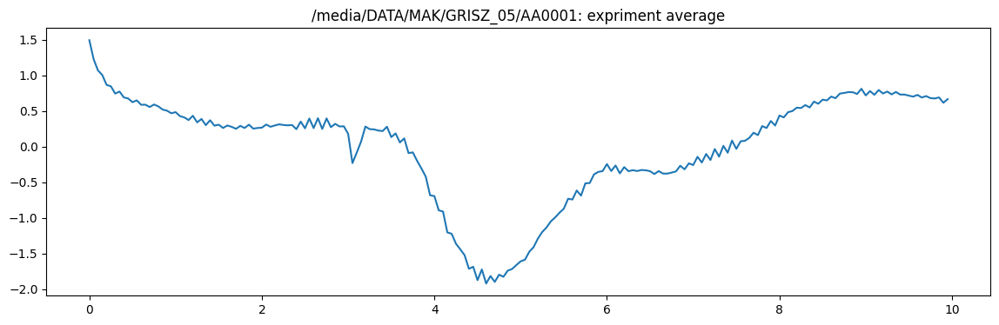

In [26]:
import matplotlib.pyplot as plt

df_dir_long.mean(axis=1).plot(figsize=(14,4))
plt.title(f"{dir}: expriment average")

# F re elapsed time: multiple animals

## all traces on same plot re elapsed time in seconds

In [9]:
import plotly.express as px
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import numpy as np

# F = 'rawF'
# F = 'F_linFilt'
F = 'F_subBase'

for d,df_dir in df.groupby('dir'):
    df_dir = df_dir.sort_values(by='timestamp_init',ascending=True)
    df_dir = df_dir[['elapsed_s',F]].set_index('elapsed_s')
    df_dir_long = df_dir[F].apply(pd.Series).T.set_index(t)

    # Generate a cool-to-warm colormap
    num_traces = df_dir_long.shape[1]
    colors = cm.coolwarm(np.linspace(0, 1, num_traces))
    hex_colors = [mcolors.rgb2hex(color) for color in colors]  # Convert to HEX format for Plotly

    # Prepare the DataFrame for Plotly (long-form data)
    df_dir_long_reset = df_dir_long.reset_index().melt(id_vars='index', var_name='elapsed_time_s', value_name='intensity')

    # Create the Plotly line plot
    fig = px.line(
        df_dir_long_reset,
        x='index',
        y='intensity',
        color='elapsed_time_s',
        labels={'index': 'time (s)', 'intensity': 'Fluorescence Intensity', 'elapsed_time_s': 'Elapsed Time (s)'},
        color_discrete_sequence=hex_colors  # Apply the custom color scheme
    )

    fig.update_layout(
        title=f"{d}: Fluorescence Traces: temperature <=> elapsed time",
        xaxis_title="Time (s)",
        yaxis_title="Fluorescence Intensity",
        legend_title="Elapsed Time (s)"
    )

    fig.show()


## F re early vs late experiment stage (median of timestamp)

In [10]:
df['half'] = df['timestamp_init']>df.groupby('dir')['timestamp_init'].transform('median')
#SAME:  df.groupby('dir')['timestamp_init'].transform(lambda x: x.quantile(0.5))
df

,qcam,dir,xsg,pulse,dB,nFrames,timestamp_init,dim_YX,elapsed_s,t,rawF,F_linFilt,F_subBase,half
0,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0017...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0017...,6-64kHz_40dB_10000msTotal_Fs250kHz,40.0,200,2024-11-18 14:28:55,"(130, 174)",0.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[188.82723253757737, 188.03488063660478, 188.3...","[-2.041721894506196, -2.862914815675367, -2.60...","[-4.632439686750075, -5.424791587722666, -5.13...",False
1,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0032...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0032...,6-64kHz_70dB_10000msTotal_Fs250kHz,70.0,200,2024-11-18 14:33:56,"(130, 174)",301.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[191.22161803713527, 191.10433244916004, 191.1...","[0.61449366562411, 0.5090847769204743, 0.57927...","[0.9146583301755413, 0.7973727422003094, 0.855...",False
2,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0033...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0033...,6-64kHz_30dB_10000msTotal_Fs250kHz,30.0,200,2024-11-18 14:34:16,"(130, 174)",321.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[191.57701149425287, 191.1310786914235, 191.62...","[1.7603897686633445, 1.3230254463589972, 1.821...","[1.8923613742579448, 1.4464285714285836, 1.936...",False
3,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0034...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0034...,6-64kHz_40dB_10000msTotal_Fs250kHz,40.0,200,2024-11-18 14:34:36,"(130, 174)",341.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[191.41127320954908, 190.43191865605658, 190.6...","[1.5211744922602293, 0.5539414739347706, 0.750...","[2.9390394088670178, 1.959684855374519, 2.1442...",False
4,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0035...,/media/DATA/MAK/GRISZ_02/AA0001,/media/DATA/MAK/GRISZ_02/AA0001/AA0001AAAA0035...,6-64kHz_50dB_10000msTotal_Fs250kHz,50.0,200,2024-11-18 14:34:56,"(130, 174)",361.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[190.5004862953139, 190.12820512820514, 189.50...","[0.5574091412962616, 0.1991841081836867, -0.41...","[1.122205380826074, 0.7499242137173212, 0.1230...",False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
276,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0019...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0019...,6-64kHz_30dB_10000msTotal_Fs250kHz,30.0,200,2024-12-11 16:15:03,"(130, 174)",4120.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[191.85990274093723, 190.632183908046, 191.118...","[0.6647540678571033, -0.529215084720505, -0.00...","[1.9690223569533885, 0.7413035240621468, 1.227...",False
277,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0020...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0020...,6-64kHz_70dB_10000msTotal_Fs250kHz,70.0,200,2024-12-11 16:15:36,"(130, 174)",4153.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[185.40839964633068, 186.1341290893015, 185.29...","[0.8041239228262782, 1.5446230483680665, 0.718...","[1.5869584438550532, 2.31268788682587, 1.47175...",False
278,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0021...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0021...,6-64kHz_80dB_10000msTotal_Fs250kHz,80.0,200,2024-12-11 16:15:56,"(130, 174)",4173.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[184.7629089301503, 183.9527409372237, 184.587...","[0.9945845771144946, 0.2030449634252136, 0.856...","[1.7751010483768823, 0.964933055450274, 1.5995...",False
279,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0022...,/media/DATA/MAK/GRISZ_05/AA0001,/media/DATA/MAK/GRISZ_05/AA0001/AA0001AAAA0022...,6-64kHz_40dB_10000msTotal_Fs250kHz,40.0,200,2024-12-11 16:16:16,"(130, 174)",4193.0,"[0.0, 0.05, 0.10000000000000002, 0.15000000000...","[182.9736074270557, 182.69363395225463, 182.21...","[1.1763672750307137, 0.9030148241106701, 0.430...","[1.6591322470

In [11]:
sum(df['half'])

140

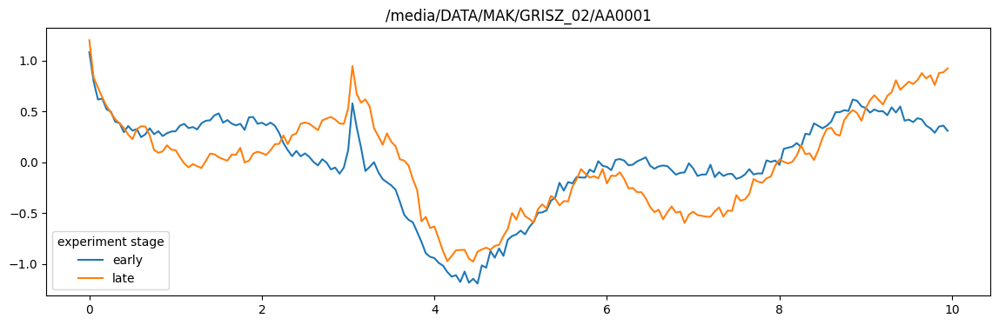

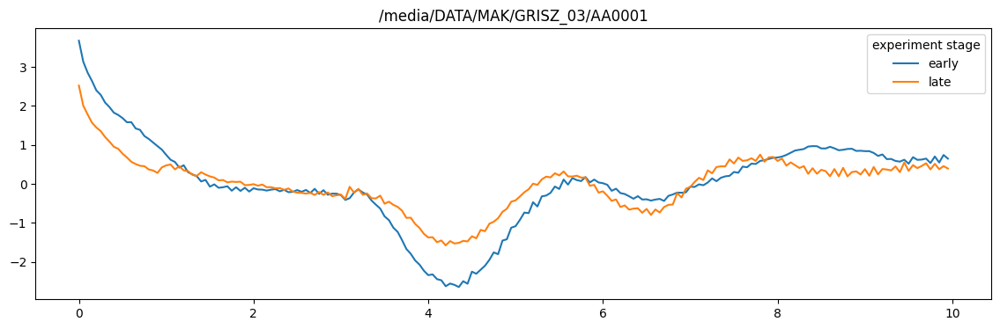

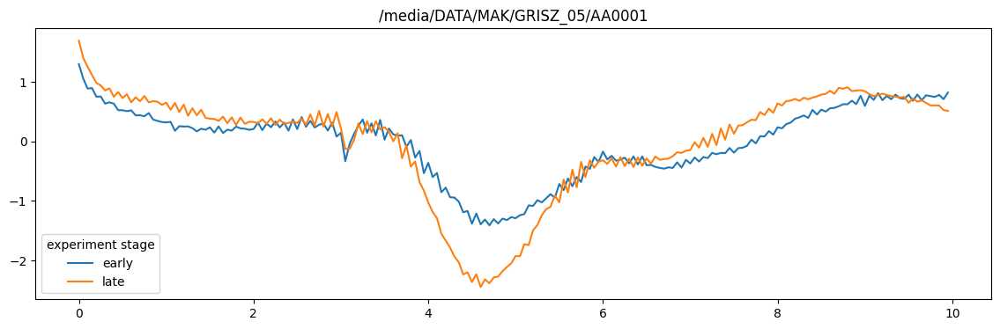

In [13]:
import matplotlib.pyplot as plt

# F = 'rawF'
F = 'F_linFilt'
# F = 'F_subBase'

for d,df_dir in df.groupby('dir'):

    fig,ax = plt.subplots(figsize=(14,4))
    for a,b in df_dir.groupby('half'):
        ax.plot(t,
                np.array(b[F].tolist()).mean(axis=0),
                label=('late' if a else 'early'))
    plt.legend(title="experiment stage")
    plt.title(d)



# F re elapsed time of experiment and sound level at half, quarter, and fifth intervals

In [14]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import plotly.express as px
import matplotlib.colors as mcolors

# F = 'rawF'
F = 'F_linFilt'
# F = 'F_subBase'

df['elapsed_q2'] = df.groupby('dir')['elapsed_s'].transform(
        lambda x: pd.qcut(x, q=2, labels=['0-50%', '50-100%'])
    )

df['elapsed_q4'] = df.groupby('dir')['elapsed_s'].transform(
        lambda x: pd.qcut(x, q=4, labels=['0-25%', '25-50%', '50-75%', '75-100%'])
    )

df['elapsed_q5'] = df.groupby('dir')['elapsed_s'].transform(
        lambda x: pd.qcut(x, q=5, labels=['0-20%', '20-40%', '40-60%', '60-80%', '80-100%'])
    )


In [15]:
df.dir.unique()

array(['/media/DATA/MAK/GRISZ_02/AA0001',
       '/media/DATA/MAK/GRISZ_03/AA0001',
       '/media/DATA/MAK/GRISZ_05/AA0001'], dtype=object)

### average fluorescence re sound level with histogram of when traces collected re sound level
- for exploring slow changes later in trace

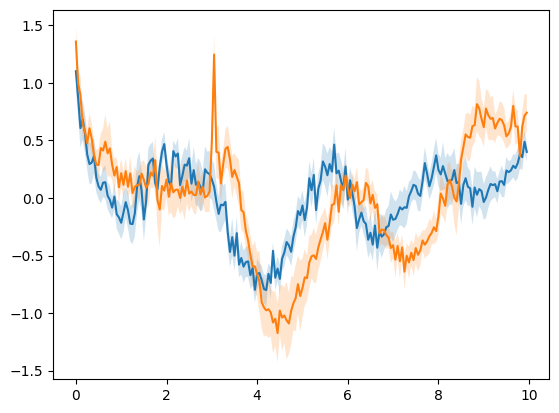

In [38]:
experimentDir = '/media/DATA/MAK/GRISZ_02/AA0001'
def meanPMstd(traceXtimeArray: np.ndarray):
    u = traceXtimeArray.mean(axis=0)
    std = traceXtimeArray.std(axis=0)
    sem = std/np.sqrt(traceXtimeArray.shape[0])

    return u,u+sem,u-sem

u,upsem,umsem = meanPMstd(np.array(df[(df['dir']==experimentDir) & (df['dB']==30)][F].tolist()))
fig, ax = plt.subplots()
ax.plot(t, u, '-', label="30")
ax.fill_between(t, umsem, upsem, alpha=0.2)
u,upsem,umsem = meanPMstd(np.array(df[(df['dir']==experimentDir) & (df['dB']==80)][F].tolist()))
ax.plot(t, u, '-', label="30")
ax.fill_between(t, umsem, upsem, alpha=0.2)


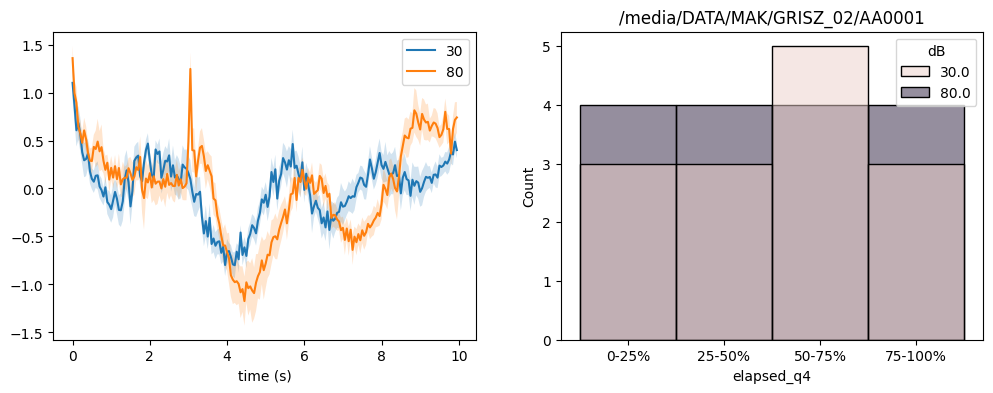

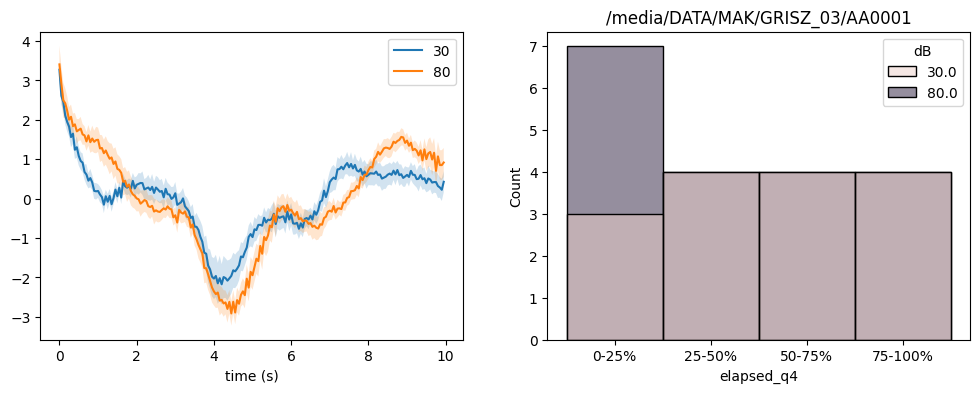

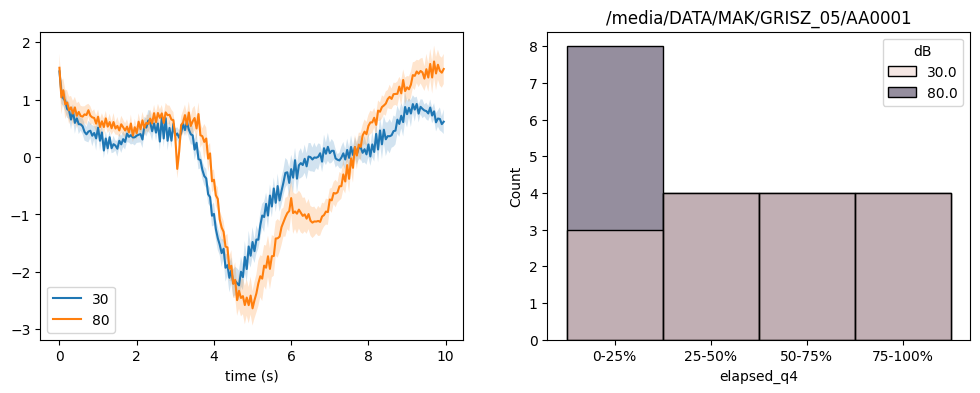

In [40]:
import seaborn as sns

split = 'elapsed_q4'
for a,b in df[((df['dB']==30) | (df['dB']==80))].groupby('dir'):
    fig, ax = plt.subplots(1,2,figsize=(12,4))
    sns.histplot(data=b,
                x=split, hue="dB", ax=ax[1]).set_title(a)
    u,upsem,umsem = meanPMstd(np.array(b[b['dB']==30][F].tolist()))
    ax[0].plot(t, u, '-', label="30")
    ax[0].fill_between(t, umsem, upsem, alpha=0.2)
    u,upsem,umsem = meanPMstd(np.array(b[b['dB']==80][F].tolist()))
    ax[0].plot(t, u, '-', label="80")
    ax[0].fill_between(t, umsem, upsem, alpha=0.2)
    ax[0].set_xlabel('time (s)')
    ax[0].legend()
    # ax[0].plot(t,np.array(b[b['dB']==30][F].tolist()).mean(axis=0),label='30')
    # ax[0].plot(t,np.array(b[b['dB']==80][F].tolist()).mean(axis=0),label='80')

    
# experimentDir = '/media/DATA/MAK/GRISZ_02/AA0001'

# df[(df['dir']==experimentDir) & (df['dB']==30)]['elapsed_q4'].hist()
# plt.title(30)
# plt.figure()
# df[(df['dir']==experimentDir) & (df['dB']==80)]['elapsed_q4'].hist()
# plt.title(80)

### average traces re duration of experiment

/tmp/ipykernel_49168/1109750161.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



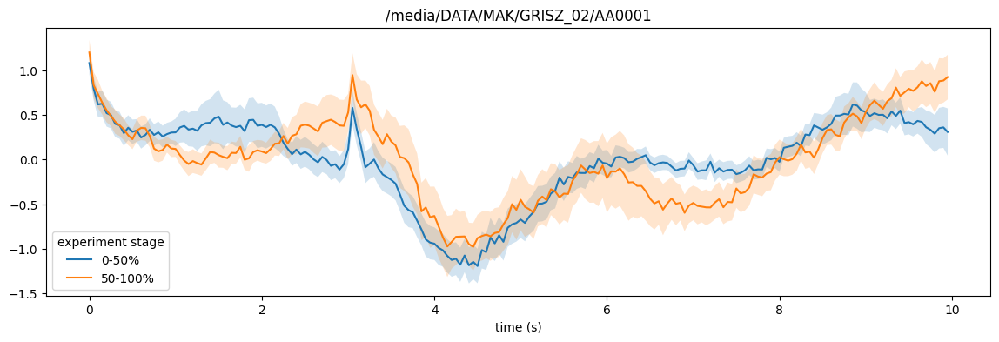

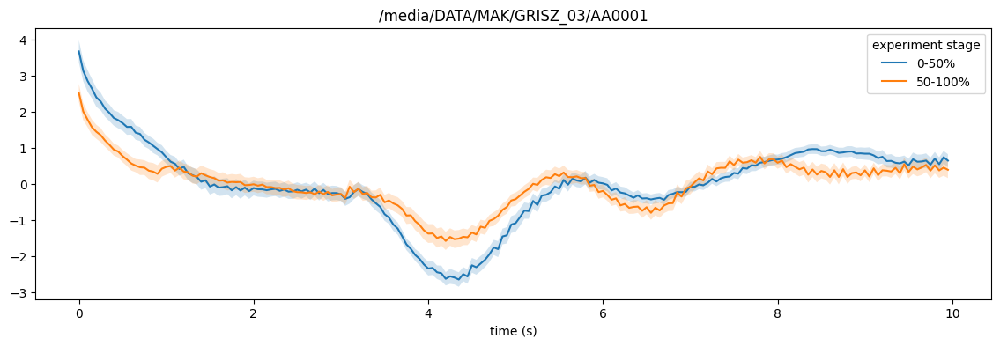

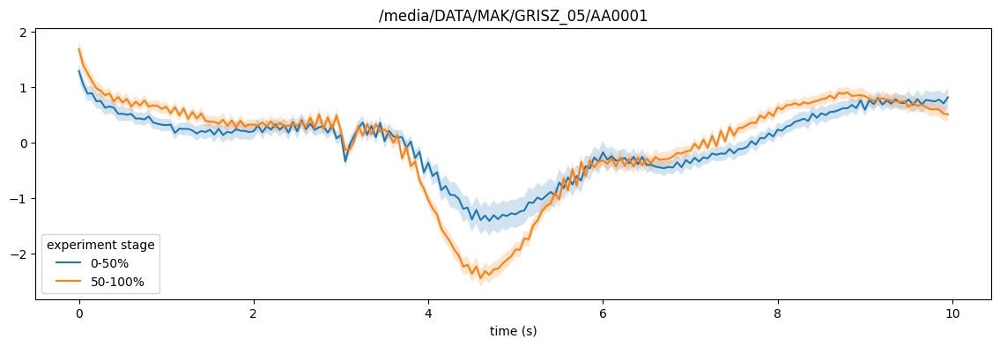

In [41]:
for d,df_dir in df.groupby('dir'):

    fig,ax = plt.subplots(figsize=(14,4))
    for a,b in df_dir.groupby('elapsed_q2'):
        u,upsem,umsem = meanPMstd(np.array(b[F].tolist()))
        ax.plot(t, u, '-', label=a)
        ax.fill_between(t, umsem, upsem, alpha=0.2)
        ax.set_xlabel('time (s)')
        ax.legend()
        # ax.plot(t,
        #         np.array(b[F].tolist()).mean(axis=0),
        #         label=a)
    plt.legend(title="experiment stage")
    plt.title(d)

/tmp/ipykernel_49168/385559947.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



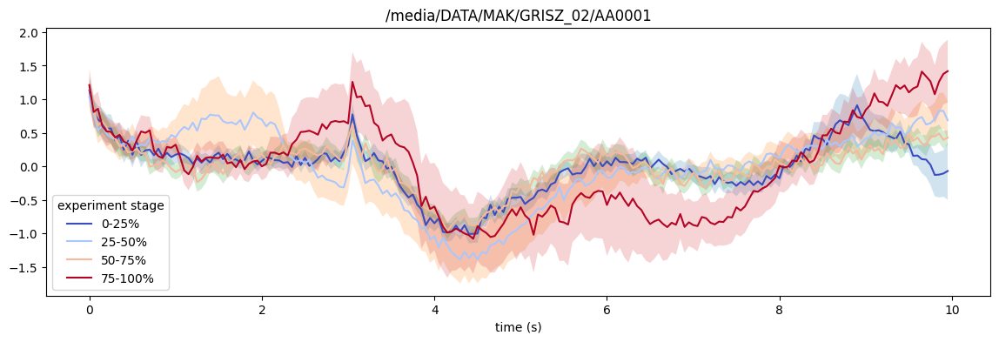

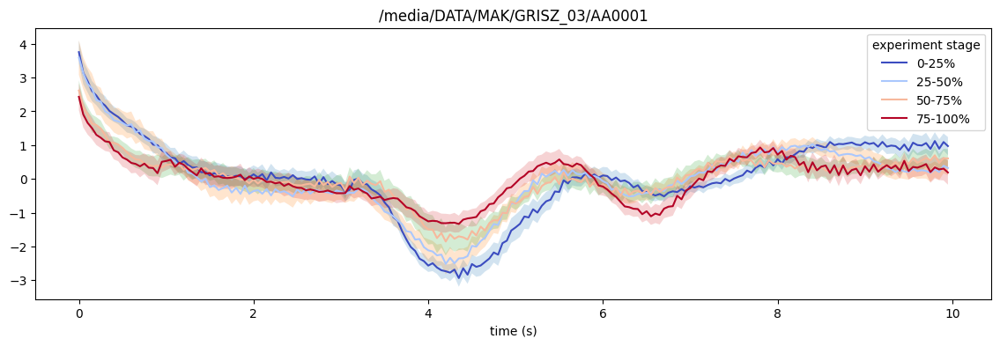

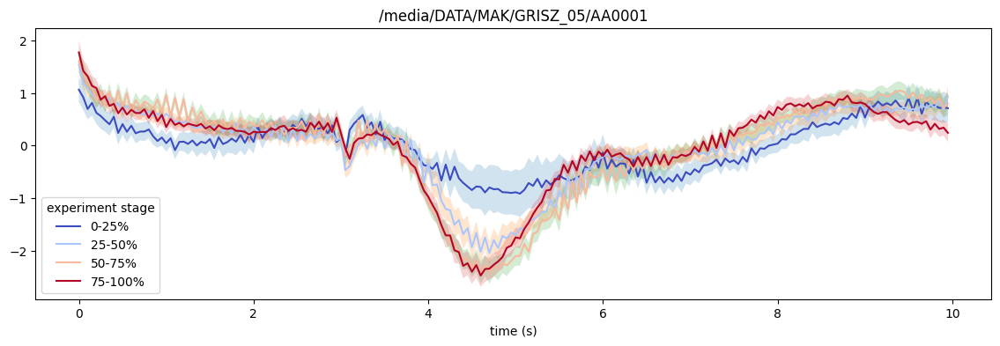

In [42]:
n_q = 4
colors = cm.coolwarm(np.linspace(0, 1, n_q))

for d,df_dir in df.groupby('dir'):

    fig,ax = plt.subplots(figsize=(14,4))
    for i,(a,b) in enumerate(df_dir.groupby('elapsed_q4')):
        u,upsem,umsem = meanPMstd(np.array(b[F].tolist()))
        ax.plot(t, u, '-', color = colors[i], label=a)
        ax.fill_between(t, umsem, upsem, alpha=0.2)
        ax.set_xlabel('time (s)')
        ax.legend()
        # ax.plot(t,
        #         np.array(b[F].tolist()).mean(axis=0),
        #         label=a,
        #         color = colors[i])
    plt.legend(title="experiment stage")
    plt.title(d)

/tmp/ipykernel_38677/1245979061.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for i,(a,b) in enumerate(df_dir.groupby('elapsed_q5')):


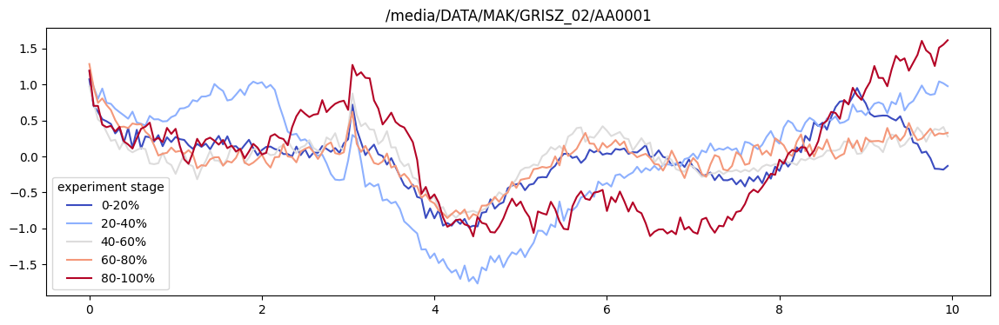

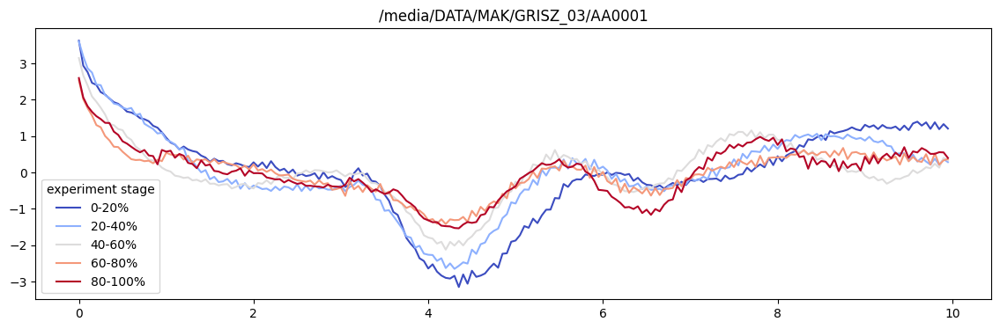

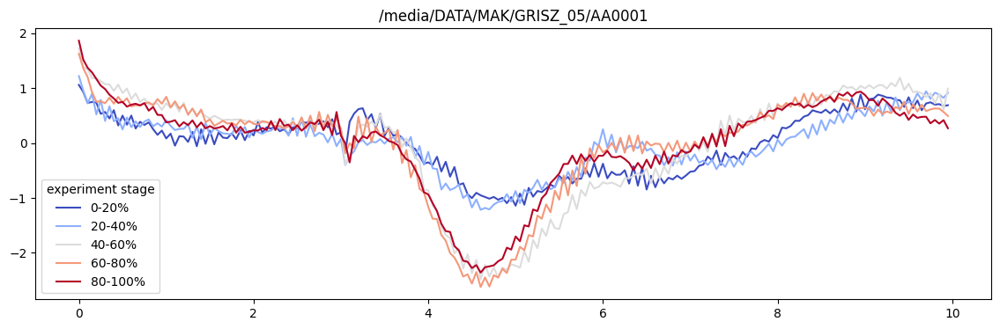

In [13]:
n_q = 5
colors = cm.coolwarm(np.linspace(0, 1, n_q))

for d,df_dir in df.groupby('dir'):

    fig,ax = plt.subplots(figsize=(14,4))
    for i,(a,b) in enumerate(df_dir.groupby('elapsed_q5')):
        ax.plot(t,
                np.array(b[F].tolist()).mean(axis=0),
                label=a,
                color = colors[i])
    plt.legend(title="experiment stage")
    plt.title(d)